# Setup

- The Liesel documentation can be found here: https://docs.liesel-project.org/en/latest/
- Track the release of new versions and report bugs here: https://github.com/liesel-devs/liesel
- Please feel invited to ask questions here: https://github.com/liesel-devs/liesel/discussions

In [66]:
# This cell installs the necessary packages.
# Uncomment the lines below to install the packages when running
# the notebook on Google Colab.

# %%capture
# !apt install libgraphviz-dev # necessary here for successful pygraphviz installation
# %pip install pygraphviz # install pygraphviz (for plotting model graphs nicely)
# %pip install rpy2 # install rpy2 for interfacing R and Python
# %pip install liesel # install liesel
# %pip install plotnine # install plotnine for ggplot2-like plotting in Python


In [67]:
# This cell installs R, mgcv and BayesX for us
# Uncomment the lines below to install the packages when running
# the notebook on Google Colab.

# careful, the installation of BayesX takes a long time!

# the command '%%capture' prevents ouput from being continuously printed
# this is nice here, because the output is very long

# %%capture
# !apt-get install -y r-base
# !Rscript -e "install.packages('mgcv', repos='http://cran.rstudio.com/')"
# !Rscript -e "install.packages('BayesX', repos='http://cran.rstudio.com/')"

In [68]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [69]:
import pandas as pd # for data frames
import numpy as np # for numerical operations
import jax.numpy as jnp # for jit-compilable numerical operations
import tensorflow_probability.substrates.jax.distributions as tfd # for probability distributions

import liesel.model as lsl # Liesel's model-building module
import liesel.goose as gs # Liesel's MCMC module
from liesel.distributions import MultivariateNormalDegenerate as MVND # for the rank-deficient multivariate normal distribution

import plotnine as p9 # for ggplot2-like plotting

In [70]:
# for interfacing R and Python
from rpy2 import robjects

robjects.pandas2ri.activate()

In [71]:
%%R
# the %%R magic command allows us to run R code in a cell
library(mgcv)

# Data Import

In [72]:
%%R -o zambia
# the -o flag allows us to pass variables from R to Python
# in this case, we pass the zambia data frame to Python
# multiple variables can be passed by separating them with commas, without spaces.

zambia <- read.table(
    "https://raw.githubusercontent.com/liesel-devs/florence-2025/refs/heads/main/data/zambia.dat",
    header=TRUE
  )

zambia_bnd <- BayesX::read.bnd("https://raw.githubusercontent.com/liesel-devs/florence-2025/refs/heads/main/data/zambia.bnd")
zambia_gra <- BayesX::read.gra("https://raw.githubusercontent.com/liesel-devs/florence-2025/refs/heads/main/data/zambia.gra")

zambia$district <- factor(zambia$district, levels=names(zambia_bnd))
zambia$district_name <- names(zambia_bnd)[zambia$district]

zambia$z <- zambia$z |> scale() |> drop()
zambia$age <- zambia$age |> scale() |> drop()
zambia$bmi  <- zambia$bmi  |> scale() |> drop()

Note: map consists of 54 polygons
Note: map consists of 54 regions
Reading map ... finished
Note: map consists of 54 regions
Reading map ... finished


Read 19522 records
Read 345 items
Zusätzlich: Es gab 11 Warnungen (Anzeige mit warnings())


In [73]:
# pass the zambia data frame to Python
# we explicitly convert the data frame to a pandas data frame
zambia = robjects.globalenv['zambia']

# Model 1

## Model setup

### Nonlinear effect of age

In [74]:
%%R -o basis_age_r,pen_age_r
# set up basis matrix and penalty matrix in magcv

s_age <- mgcv::smoothCon(
    s(age, bs="ps", m=c(3,2), k=20),
    data = zambia,
    knots = NULL,
    absorb.cons = TRUE
)

# basis_age_r <- s_age[[1]]$X
# pen_age_r <- s_age[[1]]$S[[1]]

# optional diagonalization of the penalty matrix
s_age <- s_age[[1]] |> mgcv::smooth2random(vnames = "", type = 2)

basis_age_r <- cbind(s_age$rand$Xr, s_age$Xf)
pen_age_r <- diag(s_age$pen.ind)

In [75]:
# get R objects into python
basis_age_r = robjects.globalenv['basis_age_r']
pen_age_r = robjects.globalenv['pen_age_r']

In [76]:
# set up structured additive term in liesel
basis_age = lsl.Var.new_obs(basis_age_r, name="basis_age")

mvnd = MVND.from_penalty(loc=0.0, var=1.0, pen=pen_age_r)

# set up tau2 prior and variable
# tau2_age_prior = lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01)
# tau2_age = lsl.Var.new_param(10.0, tau2_age_prior, name="tau2_age")
# var_param_age = tau2_age

# A diffuse prior with nonzero density at zero
# The scale can be set according to the principles of a scale-dependent prior
# See Klein & Kneib (2016) for details
tau_age_prior = lsl.Dist(tfd.Weibull, concentration=0.5, scale=20.0)
tau_age = lsl.Var.new_param(10.0, tau_age_prior, name="tau_age")
tau2_age = lsl.Var.new_calc(jnp.square, tau_age, name="tau2_age")
var_param_age = tau_age

# set up coefficient prior
coef_age_prior = lsl.Dist(
    MVND.from_penalty,
    loc=0.0,
    var=tau2_age,
    pen=pen_age_r,
    rank=mvnd.rank,
    log_pdet=mvnd.log_pdet
)

# set up coefficient variable
coef_age = lsl.Var.new_param(
    value=jnp.zeros(basis_age_r.shape[1]),
    distribution=coef_age_prior,
    name="coef_age"
)

# set up effect variable
s_age = lsl.Var.new_calc(jnp.dot, basis_age, coef_age, name="s_age")

liesel.model.model - INFO - Converted dtype of Value(name="").value
liesel.model.model - INFO - Converted dtype of Value(name="basis_age_value").value
liesel.model.nodes - INFO - Unnamed nodes were temporarily named for plottingThe automatically assigned names are: ['n0', 'n1', 'n2', 'n3', 'n4', 'n5']. The names are reset after plotting.


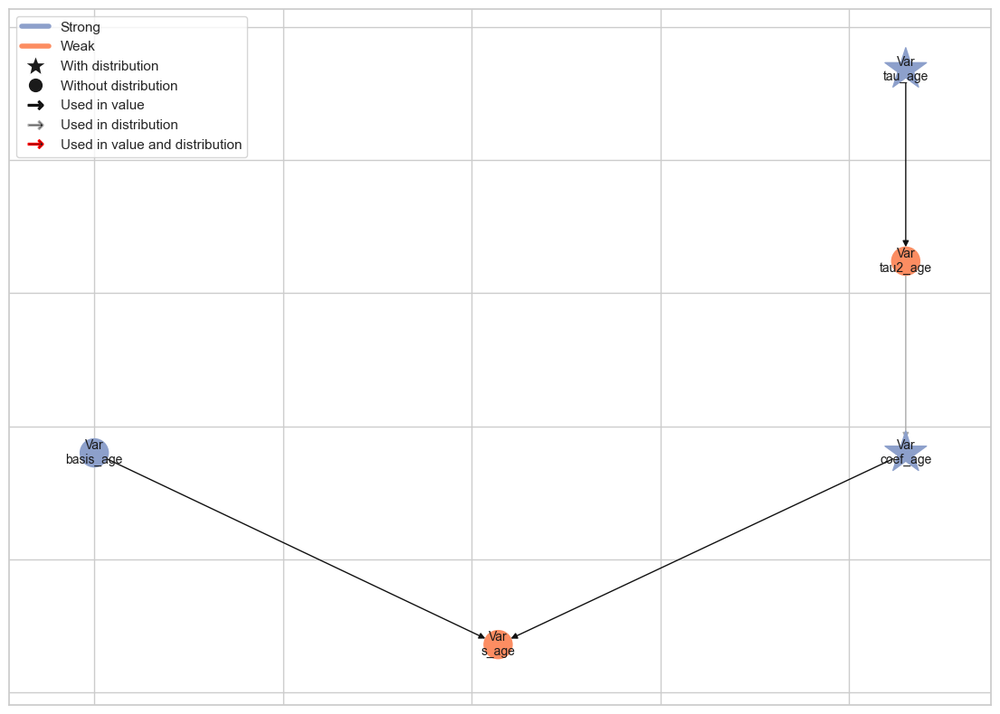

In [77]:
s_age.plot_vars()

### Nonlinear effect of BMI

In [78]:
%%R -o basis_bmi_r,pen_bmi_r
# set up basis matrix and penalty matrix in magcv

s_bmi <- s(bmi, bs="ps", m=c(3,2), k=20)
s_bmi <- mgcv::smoothCon(s_bmi, data = zambia, absorb.cons = TRUE)


# basis_bmi_r <- s_bmi[[1]]$X
# pen_bmi_r <- s_bmi[[1]]$S[[1]]

# optional diagonalization of the penalty matrix
s_bmi <- s_bmi[[1]] |> mgcv::smooth2random(vnames = "", type = 2)

basis_bmi_r <- cbind(s_bmi$rand$Xr, s_bmi$Xf)
pen_bmi_r <- diag(s_bmi$pen.ind)

In [79]:
# get R objects into python
basis_bmi_r = robjects.globalenv['basis_bmi_r']
pen_bmi_r = robjects.globalenv['pen_bmi_r']

In [80]:
# set up structured additive term in liesel
basis_bmi = lsl.Var.new_obs(basis_bmi_r, name="basis_bmi")

mvnd = MVND.from_penalty(loc=0.0, var=1.0, pen=pen_bmi_r)

# set up tau2 prior and variable
# tau2_bmi_prior = lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01)
# tau2_bmi = lsl.Var.new_param(10.0, tau2_bmi_prior, name="tau2_bmi")
# var_param_bmi = tau2_bmi

# A diffuse prior with nonzero density at zero
# The scale can be set according to the principles of a scale-dependent prior
# See Klein & Kneib (2016) for details
tau_bmi_prior = lsl.Dist(tfd.Weibull, concentration=0.5, scale=20.0)
tau_bmi = lsl.Var.new_param(10.0, tau_bmi_prior, name="tau_bmi")
tau2_bmi = lsl.Var.new_calc(jnp.square, tau_bmi, name="tau2_bmi")
var_param_bmi = tau_bmi

# set up coefficient prior
coef_bmi_prior = lsl.Dist(
    MVND.from_penalty,
    loc=0.0,
    var=tau2_bmi,
    pen=pen_bmi_r,
    rank=mvnd.rank,
    log_pdet=mvnd.log_pdet
)

# set up coefficient variable
coef_bmi = lsl.Var.new_param(
    value=jnp.zeros(basis_bmi_r.shape[1]),
    distribution=coef_bmi_prior,
    name="coef_bmi"
)

# set up effect variable
s_bmi = lsl.Var.new_calc(jnp.dot, basis_bmi, coef_bmi, name="s_bmi")

liesel.model.model - INFO - Converted dtype of Value(name="").value
liesel.model.model - INFO - Converted dtype of Value(name="basis_bmi_value").value
liesel.model.nodes - INFO - Unnamed nodes were temporarily named for plottingThe automatically assigned names are: ['n0', 'n1', 'n2', 'n3', 'n4', 'n5']. The names are reset after plotting.


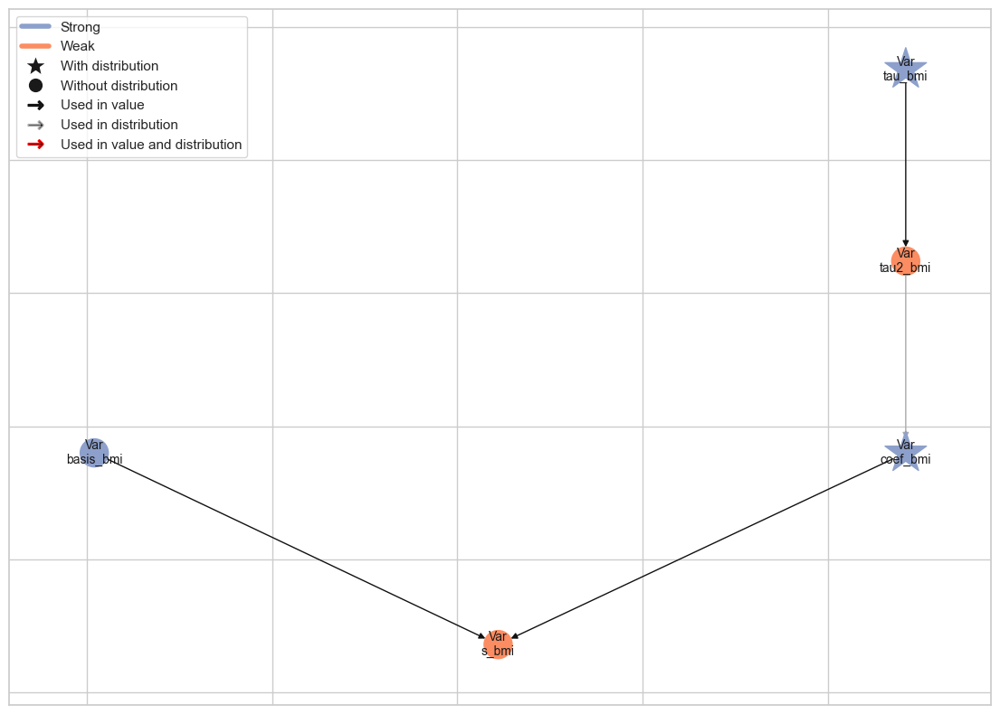

In [81]:
s_bmi.plot_vars()

### Set up observation model

In [82]:
intercept = lsl.Var.new_param(
    zambia["z"].mean(), # crude starting value
    name="intercept"
)

loc = lsl.Var.new_calc(lambda *args: sum(args), intercept, s_age, s_bmi, name="loc")

variance = lsl.Var.new_param(
    zambia["z"].var(), # crude starting value
    lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01), 
    name="variance"
)

scale = lsl.Var.new_calc(jnp.sqrt, variance, name="scale")

z_dist = lsl.Dist(tfd.Normal, loc=loc, scale=scale)
z = lsl.Var.new_obs(zambia["z"].values, distribution=z_dist, name="z")

liesel.model.model - INFO - Converted dtype of Value(name="z_value").value
liesel.model.model - INFO - Converted dtype of Value(name="variance_value").value
liesel.model.model - INFO - Converted dtype of Value(name="intercept_value").value
liesel.model.nodes - INFO - Unnamed nodes were temporarily named for plottingThe automatically assigned names are: ['n0', 'n1', 'n2', 'n3', 'n4', 'n5', 'n6', 'n7', 'n8', 'n9', 'n10', 'n11', 'n12', 'n13']. The names are reset after plotting.


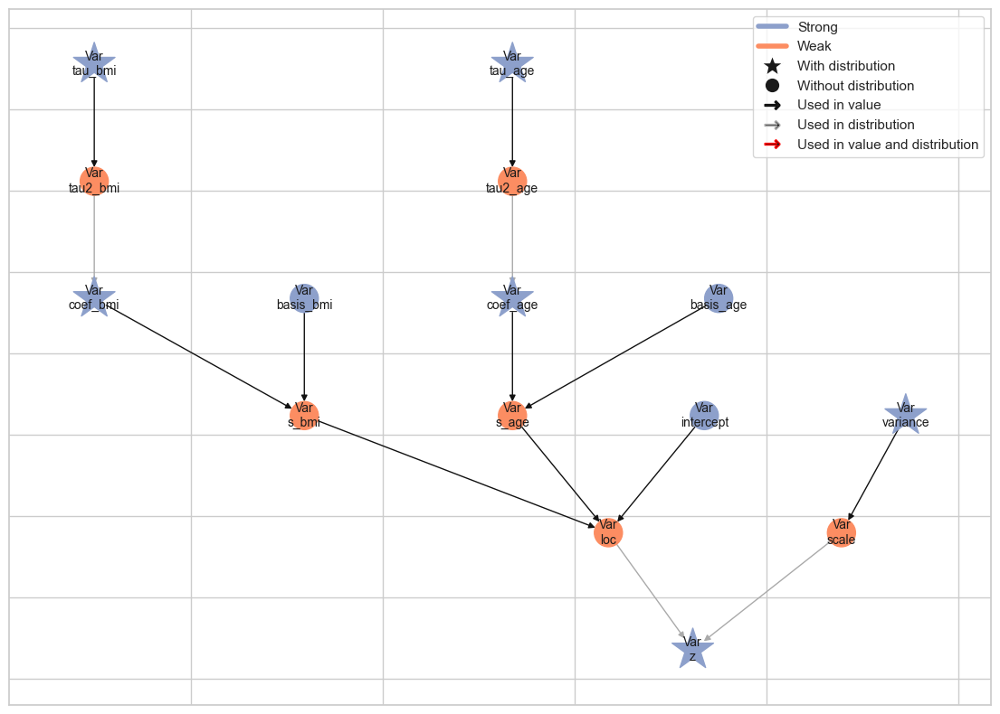

In [83]:
z.plot_vars()

### Set up model

In [84]:
model1 = lsl.Model([z])
interface = gs.LieselInterface(model1)

## Parameter estimation

### Pre-optimize for starting values

In [85]:
import optax

# crude, but robust optimization
preopt = gs.optim_flat(
    model_train=model1,
    params=[intercept.name, coef_age.name, coef_bmi.name, variance.name],
    stopper=gs.Stopper(max_iter=10_000, patience=10, atol=1e-3),
    optimizer=optax.adam(learning_rate=0.01)
)

Training loss: 20207.631, Validation loss: 20207.629:   0%|          | 0/10000 [00:00<?, ?it/s]

Training loss: 19076.961, Validation loss: 19076.963:   8%|▊         | 762/10000 [00:05<01:01, 150.63it/s]

### MCMC Sampling

In [86]:
eb = gs.EngineBuilder(seed=42, num_chains=4)

eb.set_model(interface)
eb.set_initial_values(preopt.model_state)

eb.add_kernel(gs.NUTSKernel([intercept.name]))

eb.add_kernel(gs.IWLSKernel([coef_age.name]))
eb.add_kernel(gs.IWLSKernel([coef_bmi.name]))

eb.add_kernel(gs.NUTSKernel([var_param_age.name]))
eb.add_kernel(gs.NUTSKernel([var_param_bmi.name]))

eb.add_kernel(gs.NUTSKernel([variance.name]))

eb.positions_included = [s_age.name, s_bmi.name]

eb.set_duration(warmup_duration=2000, posterior_duration=4000, thinning_posterior=10)

In [87]:
engine = eb.build()

liesel.goose.builder - WARNING - No jitter functions provided. The initial values won't be jittered
liesel.goose.engine - INFO - Initializing kernels...
liesel.goose.engine - INFO - Done


In [88]:
engine.sample_all_epochs()

liesel.goose.engine - INFO - Starting epoch: FAST_ADAPTATION, 75 transitions, 25 jitted together
100%|██████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/chunk] [00:16<01:01, 150.63it/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 1, 1, 0, 0 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_03: 14, 9, 13, 8 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_04: 15, 11, 12, 11 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_05: 2, 2, 1, 3 / 75 transitions
liesel.goose.engine - INFO - Finished epoch
liesel.goose.engine - INFO - Starting epoch: SLOW_ADAPTATION, 25 transitions, 25 jitted together
100%|█████████████████████████████████████████| 1/1 [00:00<00:00, 509.14chunk/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 2, 1, 1, 1 / 25 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_03: 2, 5, 1, 2 / 25 transitions
liesel.goose.eng

In [89]:
results1 = engine.get_results()
samples1 = results1.get_posterior_samples()
summary1 = gs.Summary(results1, deselected=eb.positions_included)

In [90]:
summary1

Parameter summary:

                    kernel      mean        sd    q_0.05     q_0.5    q_0.95  \
parameter index                                                                
coef_age  (0,)   kernel_01  0.001603  0.033677 -0.051688  0.001631  0.057525   
          (1,)   kernel_01  0.013547  0.036066 -0.038103  0.009527  0.080245   
          (2,)   kernel_01 -0.002023  0.033276 -0.057468 -0.002110  0.050347   
          (3,)   kernel_01 -0.004449  0.033488 -0.060033 -0.003425  0.048642   
          (4,)   kernel_01 -0.008528  0.031783 -0.060733 -0.006371  0.041152   
          (5,)   kernel_01  0.029354  0.037036 -0.021992  0.024584  0.099019   
          (6,)   kernel_01  0.033083  0.033757 -0.012679  0.028391  0.094688   
          (7,)   kernel_01 -0.013474  0.028368 -0.063383 -0.012106  0.029055   
          (8,)   kernel_01  0.041648  0.029112  0.000669  0.038718  0.092707   
          (9,)   kernel_01 -0.005730  0.024588 -0.045317 -0.005815  0.031532   
          (10,)  kernel_01  0.013110  0.023107 -0.022767  0.011710  0.052518   
          (11,)  kernel_01 -0.025080  0.022053 -0.061822 -0.023949  0.008049   
          (12,)  kernel_01  0.003170  0.019178 -0.026663  0.002920  0.034867   
          (13,)  kernel_01 -0.022737  0.016712 -0.049264 -0.022732  0.004486   
          (14,)  kernel_01 -0.003269  0.012738 -0.024953 -0.003033  0.017547   
          (15,)  kernel_01  0.017634  0.009345  0.002321  0.017167  0.033311   
          (16,)  kernel_01 -0.029332  0.005221 -0.038013 -0.029199 -0.020909   
          (17,)  kernel_01  0.022732  0.002334  0.019006  0.022755  0.026627   
          (18,)  kernel_01 -1.856469  0.146561 -2.103636 -1.852248 -1.623366   
coef_bmi  (0,)   kernel_02 -0.000085  0.006341 -0.008229 -0.000001  0.006881   
          (1,)   kernel_02  0.000019  0.007467 -0.007517 -0.000013  0.006703   
          (2,)   kernel_02 -0.000293  0.006672 -0.008735 -0.000033  0.006680   
          (3,)   kernel_02  0.000416  0.006016 -0.006631  0.000006  0.008353   
          (4,)   kernel_02  0.000551  0.006364 -0.006784  0.000077  0.009095   
          (5,)   kernel_02 -0.000049  0.006065 -0.007621  0.000007  0.007028   
          (6,)   kernel_02  0.000806  0.006347 -0.005620  0.000055  0.010191   
          (7,)   kernel_02 -0.000905  0.006475 -0.010520 -0.000037  0.005711   
          (8,)   kernel_02 -0.000020  0.005603 -0.007387  0.000005  0.006834   
          (9,)   kernel_02 -0.000591  0.005951 -0.009313 -0.000029  0.006091   
          (10,)  kernel_02 -0.001259  0.007053 -0.010946 -0.000108  0.005302   
          (11,)  kernel_02  0.000105  0.005492 -0.006150  0.000030  0.007367   
          (12,)  kernel_02 -0.000948  0.005693 -0.009930 -0.000093  0.004990   
          (13,)  kernel_02 -0.000514  0.005209 -0.008313 -0.000071  0.005697   
          (14,)  kernel_02 -0.001669  0.006721 -0.011712 -0.000133  0.003947   
          (15,)  kernel_02 -0.000177  0.004745 -0.008098  0.000089  0.005983   
          (16,)  kernel_02  0.002684  0.005660 -0.001858  0.000554  0.014038   
          (17,)  kernel_02  0.001687  0.002315 -0.000708  0.001057  0.006016   
          (18,)  kernel_02  1.475083  0.328482  0.829448  1.549892  1.875435   
intercept ()     kernel_00  0.000192  0.007601 -0.012698  0.000039  0.012637   
tau_age   ()     kernel_03  0.033223  0.014110  0.016932  0.030233  0.061500   
tau_bmi   ()     kernel_04  0.003804  0.005275  0.000209  0.002013  0.013923   
variance  ()     kernel_05  0.854793  0.010327  0.837590  0.854830  0.871871   

                 sample_size     ess_bulk     ess_tail      rhat  
parameter index                                                   
coef_age  (0,)          1600  1111.661188  1020.328852  1.005660  
          (1,)          1600   726.926666   928.627935  1.003564  
          (2,)          1600  1222.124860  1244.548534  1.004765  
          (3,)          1600  1167.880790  1127.004543  1.004411  
          (4,)          1600  1079.739666  1098.124120  1

### MCMC Diagnostics

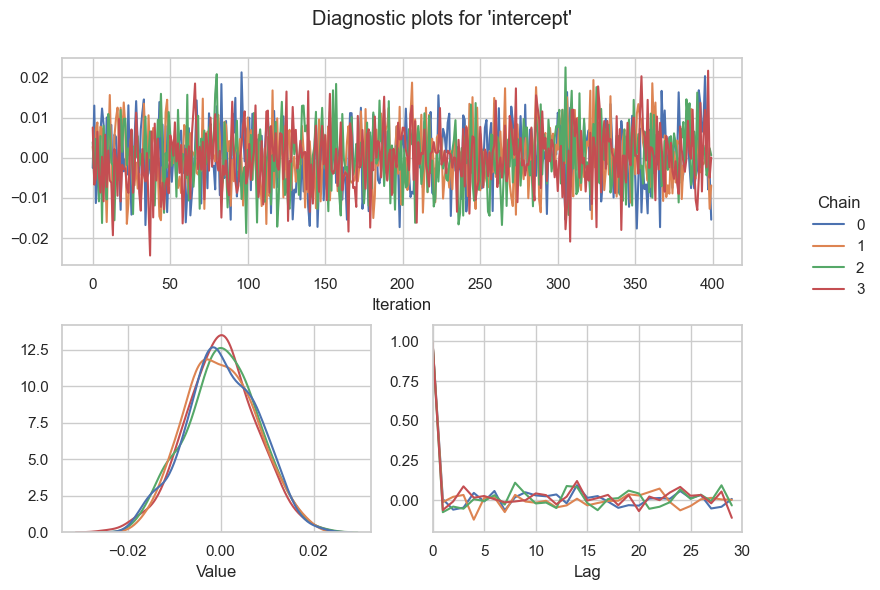

In [91]:
gs.plot_param(results1, "intercept")

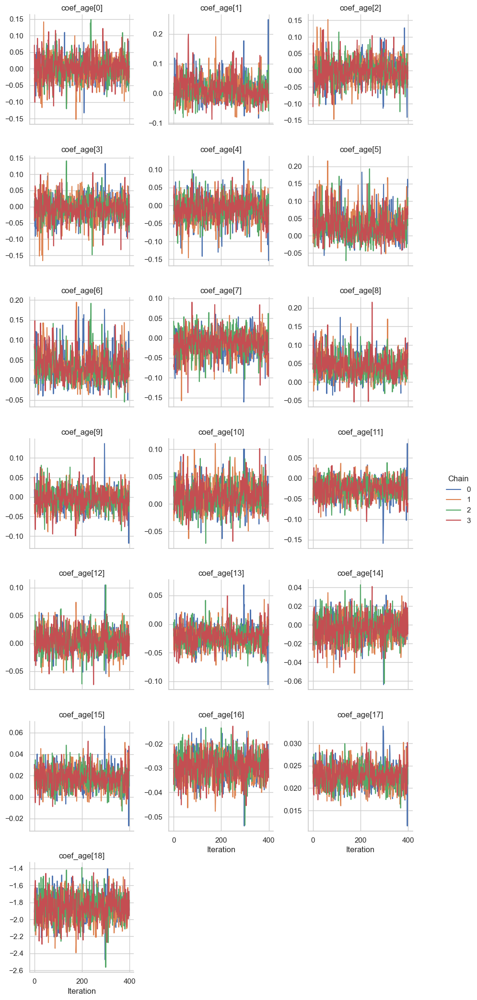

In [92]:
gs.plot_trace(results1, "coef_age")

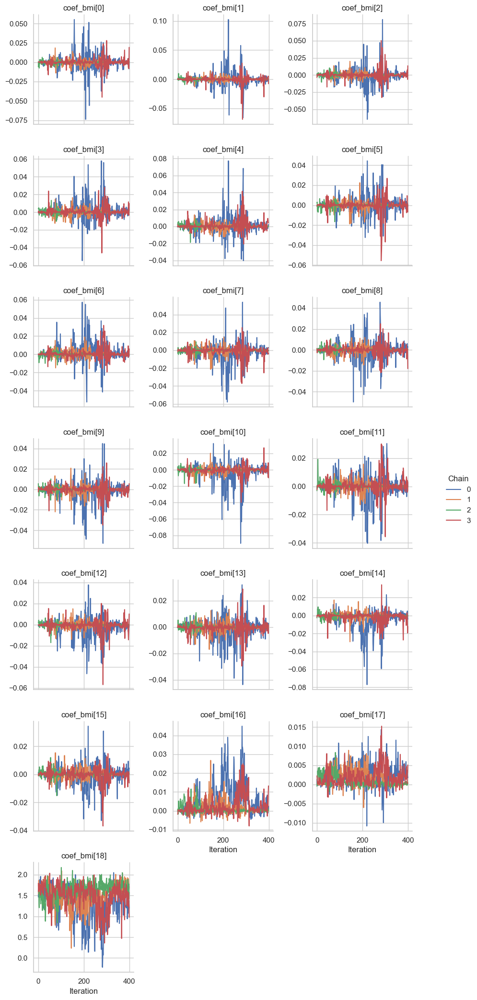

In [93]:
gs.plot_trace(results1, "coef_bmi")

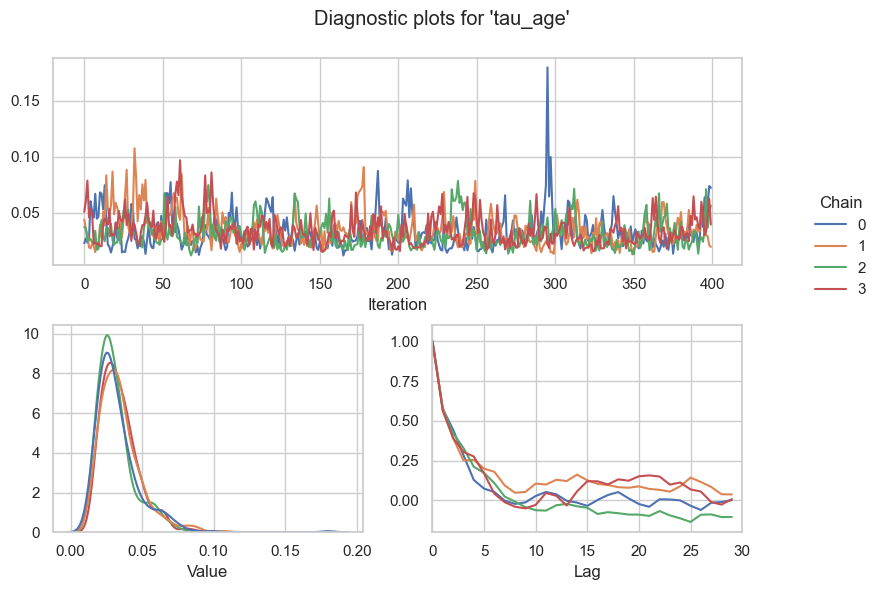

In [94]:
try:
    gs.plot_param(results1, "tau2_age")
except KeyError:
    gs.plot_param(results1, "tau_age")

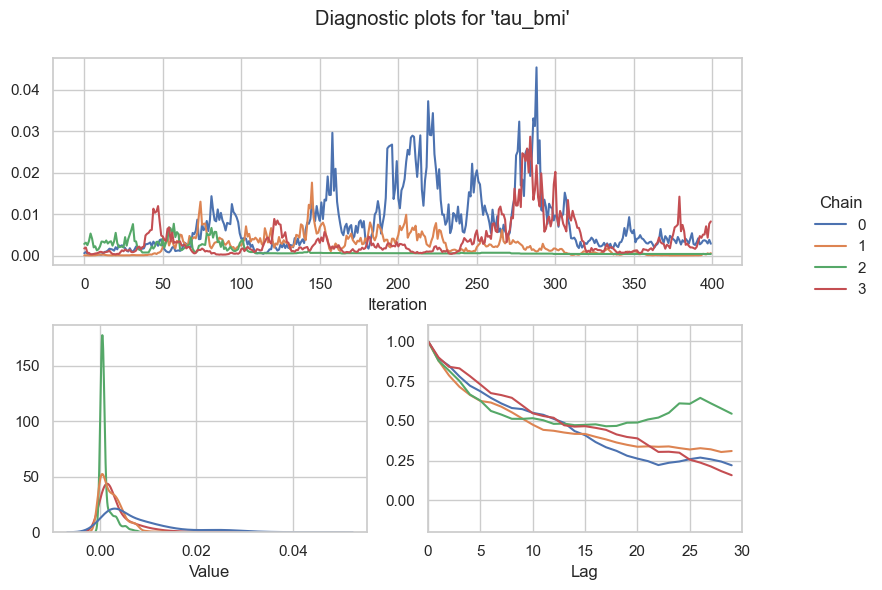

In [95]:
try:
    gs.plot_param(results1, "tau2_bmi")
except KeyError:
    gs.plot_param(results1, "tau_bmi")

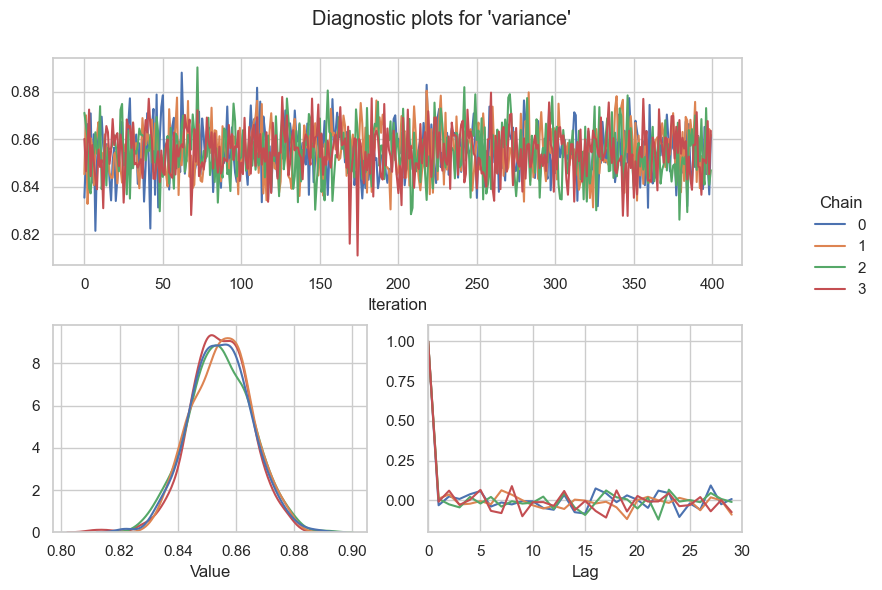

In [96]:
gs.plot_param(results1, "variance")

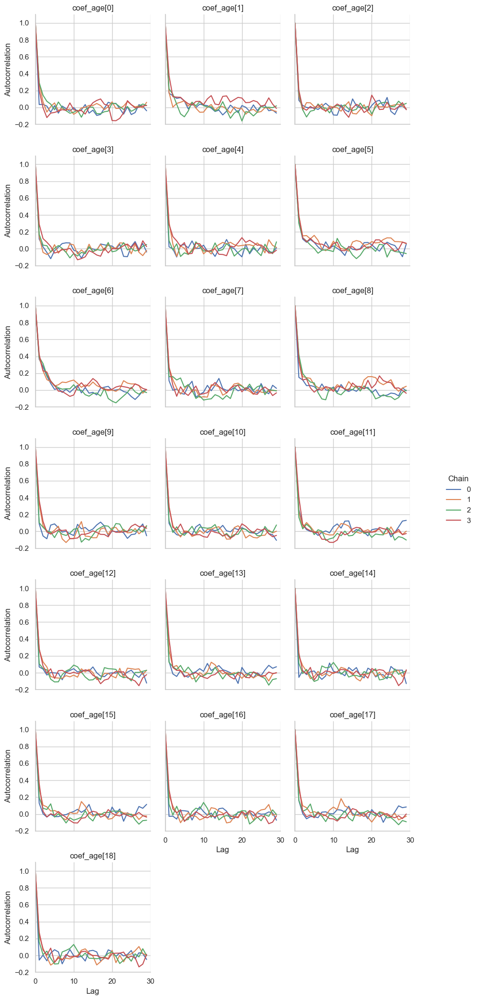

In [97]:
gs.plot_cor(results1, "coef_age")

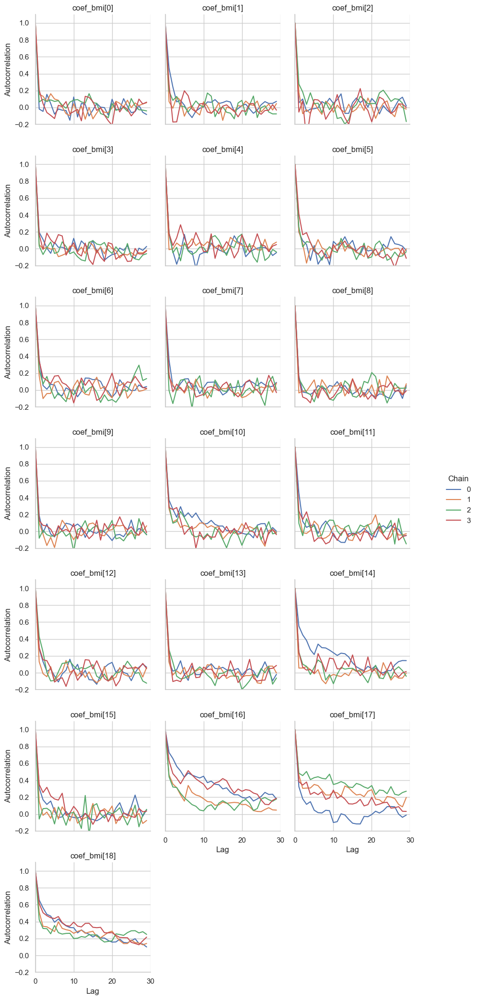

In [98]:
gs.plot_cor(results1, "coef_bmi")

## Results

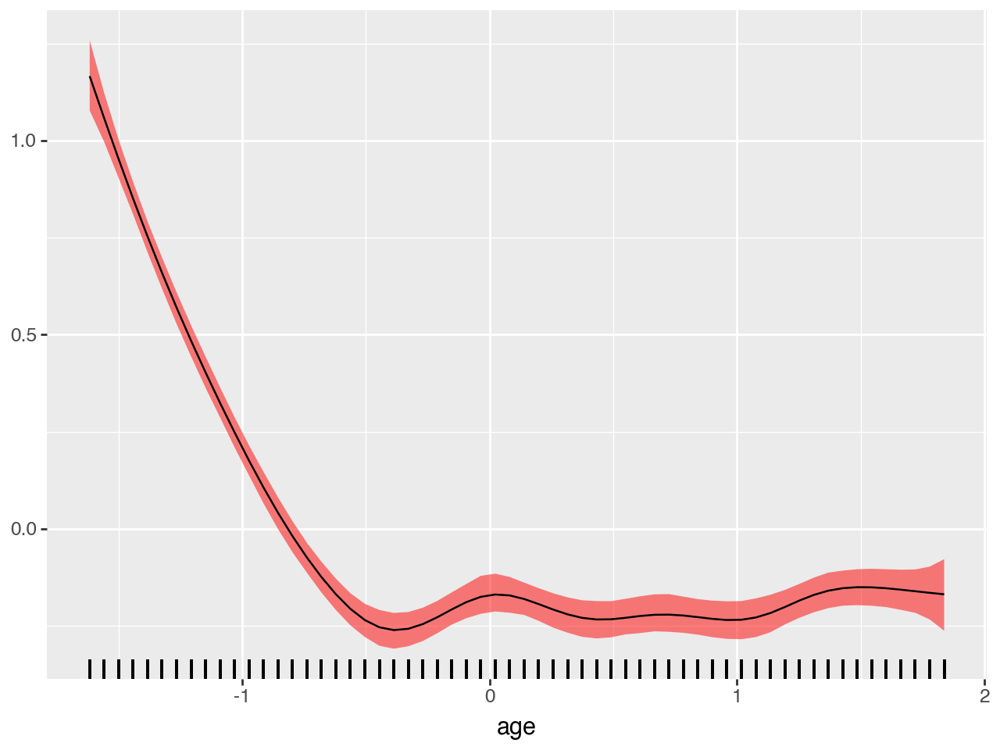

In [99]:
age_samples = np.asarray(samples1[s_age.name]) # convert to numpy array for plotting

s_age_mean = np.mean(samples1[s_age.name], axis=(0, 1))
s_age_lo = np.quantile(samples1[s_age.name], 0.025, axis=(0, 1))
s_age_hi = np.quantile(samples1[s_age.name], 0.975, axis=(0, 1))

(
    p9.ggplot()
    + p9.geom_ribbon(p9.aes(x=zambia["age"], ymin=s_age_lo, ymax=s_age_hi), alpha=0.5, fill = "red")
    + p9.geom_line(p9.aes(x=zambia["age"], y=s_age_mean))
    + p9.geom_rug(p9.aes(x=zambia["age"]), alpha = 0.1)
)

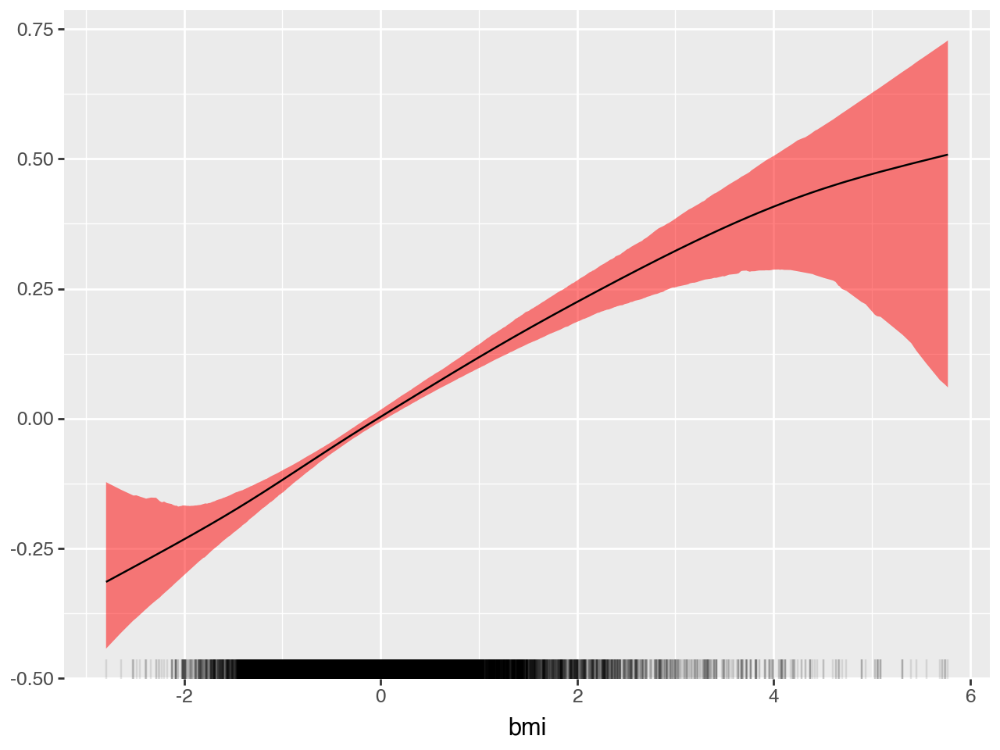

In [100]:
bmi_samples = np.asarray(samples1[s_bmi.name]) # convert to numpy for plotting

s_bmi_mean = np.mean(samples1[s_bmi.name], axis=(0, 1))
s_bmi_lo = np.quantile(samples1[s_bmi.name], 0.025, axis=(0, 1))
s_bmi_hi = np.quantile(samples1[s_bmi.name], 0.975, axis=(0, 1))

(
    p9.ggplot()
    + p9.geom_ribbon(p9.aes(x=zambia["bmi"], ymin=s_bmi_lo, ymax=s_bmi_hi), alpha=0.5, fill = "red")
    + p9.geom_line(p9.aes(x=zambia["bmi"], y=s_bmi_mean))
    + p9.geom_rug(p9.aes(x=zambia["bmi"]), alpha = 0.1)
)

# Model 2

In [101]:
# free variables from previous model
# this is necessary to avoid conflicts with the next model, if we want to re-use
# some of the variables.
_ = model1.pop_nodes_and_vars()

## Model Setup

### Spatial effect

In [102]:
%%R -o basis_age_r,pen_age_r
# set up basis matrix and penalty matrix in magcv

s_district <- mgcv::smoothCon(
    s(district, bs="mrf", xt=list(penalty=zambia_gra)),
    data = zambia,
    knots = NULL,
    absorb.cons = TRUE
)

# basis_age_r <- s_age[[1]]$X
# pen_age_r <- s_age[[1]]$S[[1]]

# optional diagonalization of the penalty matrix
s_district <- s_district[[1]] |> mgcv::smooth2random(vnames = "", type = 2)

basis_district_r <- cbind(s_district$rand$Xr, s_district$Xf)
pen_district_r <- diag(s_district$pen.ind)

In [103]:
# get R objects into python
basis_district_r = robjects.globalenv['basis_district_r']
pen_district_r = robjects.globalenv['pen_district_r']

In [104]:
# set up structured additive term in liesel
basis_district = lsl.Var.new_obs(basis_district_r, name="basis_district")

mvnd = MVND.from_penalty(loc=0.0, var=1.0, pen=pen_district_r)

# set up tau2 prior and variable
# tau2_district_prior = lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01)
# tau2_district = lsl.Var.new_param(10.0, tau2_district_prior, name="tau2_district")
# var_param_district = tau2_district

# A diffuse prior with nonzero density at zero
# The scale can be set according to the principles of a scale-dependent prior
# See Klein & Kneib (2016) for details
tau_district_prior = lsl.Dist(tfd.Weibull, concentration=0.5, scale=20.0)
tau_district = lsl.Var.new_param(10.0, tau_district_prior, name="tau_district")
tau2_district = lsl.Var.new_calc(jnp.square, tau_district, name="tau2_district")
var_param_district = tau_district

# set up coefficient prior
coef_district_prior = lsl.Dist(
    MVND.from_penalty,
    loc=0.0,
    var=tau2_district,
    pen=pen_district_r,
    rank=mvnd.rank,
    log_pdet=mvnd.log_pdet
)

# set up coefficient variable
coef_district = lsl.Var.new_param(
    value=jnp.zeros(basis_district_r.shape[1]),
    distribution=coef_district_prior,
    name="coef_district"
)

# set up effect variable
s_district = lsl.Var.new_calc(jnp.dot, basis_district, coef_district, name="s_district")

In [105]:
loc = lsl.Var.new_calc(
    lambda *args: sum(args), 
    intercept, s_age, s_bmi, s_district,
    name="loc"
)

z_dist = lsl.Dist(tfd.Normal, loc=loc, scale=scale)
z = lsl.Var.new_obs(zambia["z"].values, distribution=z_dist, name="z")

liesel.model.model - INFO - Converted dtype of Value(name="z_value").value
liesel.model.model - INFO - Converted dtype of Value(name="").value
liesel.model.model - INFO - Converted dtype of Value(name="basis_district_value").value
liesel.model.nodes - INFO - Unnamed nodes were temporarily named for plottingThe automatically assigned names are: ['n14', 'n15', 'n16', 'n17', 'n18', 'n19']. The names are reset after plotting.


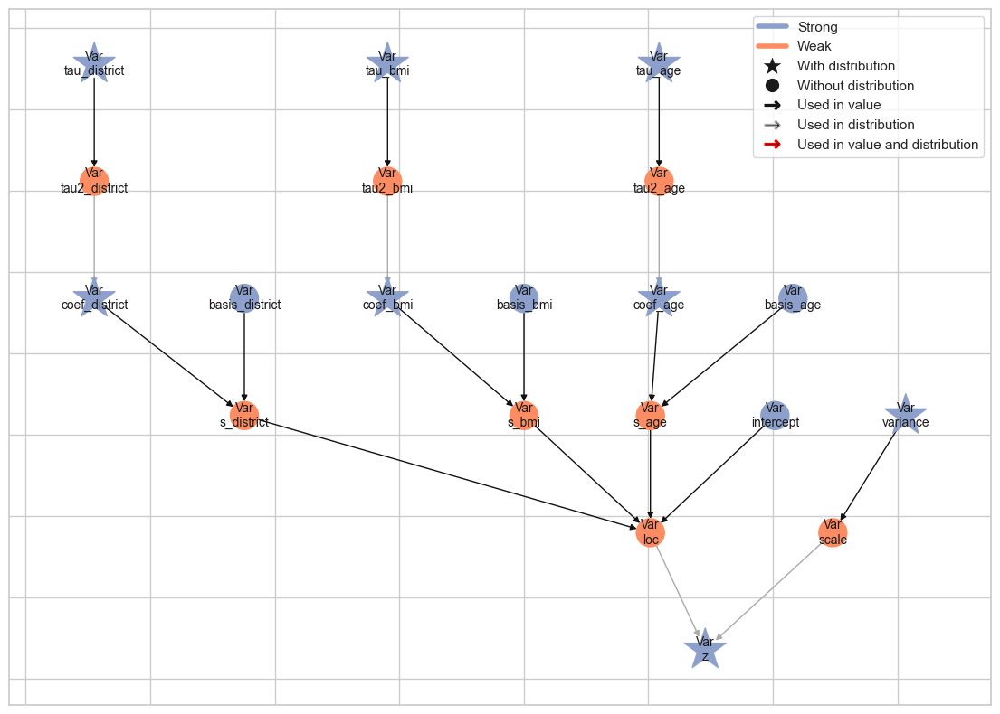

In [106]:
z.plot_vars()

In [107]:
model2 = lsl.Model([z])
interface = gs.LieselInterface(model2)

## Parameter estimation

### Pre-optimize for starting values

In [108]:
# crude, but robust optimization
preopt = gs.optim_flat(
    model_train=model2,
    params=[intercept.name, coef_age.name, coef_bmi.name, coef_district.name, variance.name],
    stopper=gs.Stopper(max_iter=10_000, patience=10, atol=1e-3),
    optimizer=optax.adam(learning_rate=0.01)
)

Training loss: 19136.330, Validation loss: 19136.334:   8%|▊         | 759/10000 [00:07<01:20, 115.27it/s]

In [109]:
eb = gs.EngineBuilder(seed=42, num_chains=4)

eb.set_model(interface)
eb.set_initial_values(preopt.model_state)

eb.add_kernel(gs.NUTSKernel([intercept.name]))

eb.add_kernel(gs.IWLSKernel([coef_age.name]))
eb.add_kernel(gs.IWLSKernel([coef_bmi.name]))
eb.add_kernel(gs.IWLSKernel([coef_district.name]))

eb.add_kernel(gs.NUTSKernel([var_param_age.name]))
eb.add_kernel(gs.NUTSKernel([var_param_bmi.name]))
eb.add_kernel(gs.NUTSKernel([var_param_district.name]))

eb.add_kernel(gs.NUTSKernel([variance.name]))

eb.positions_included = [s_age.name, s_bmi.name, s_district.name]

eb.set_duration(warmup_duration=2000, posterior_duration=4000, thinning_posterior=10)

In [110]:
engine = eb.build()

liesel.goose.builder - WARNING - No jitter functions provided. The initial values won't be jittered
liesel.goose.engine - INFO - Initializing kernels...
liesel.goose.engine - INFO - Done


In [111]:
engine.sample_all_epochs()

liesel.goose.engine - INFO - Starting epoch: FAST_ADAPTATION, 75 transitions, 25 jitted together


100%|██████████████████████████████████████████| 3/3 [00:12<00:00,  4.22s/chunk] [00:18<01:20, 115.27it/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 0, 1, 0, 0 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_04: 9, 13, 12, 15 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_05: 9, 9, 10, 9 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_06: 14, 14, 16, 8 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_07: 0, 1, 1, 0 / 75 transitions
liesel.goose.engine - INFO - Finished epoch
liesel.goose.engine - INFO - Starting epoch: SLOW_ADAPTATION, 25 transitions, 25 jitted together
100%|█████████████████████████████████████████| 1/1 [00:00<00:00, 469.27chunk/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 2, 1, 1, 2 / 25 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_04: 0, 2, 2, 3 / 25 transitions
liesel.goose.engine 

In [112]:
results2 = engine.get_results()
samples2 = results2.get_posterior_samples()
summary2 = gs.Summary(results2, deselected=eb.positions_included)

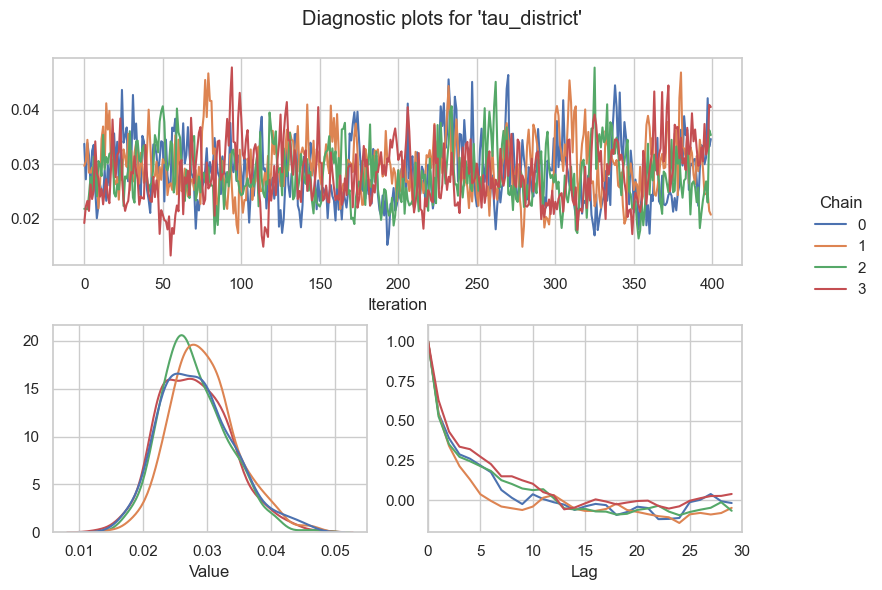

In [113]:
try:
    gs.plot_param(results2, "tau2_district")
except KeyError:
    gs.plot_param(results2, "tau_district")

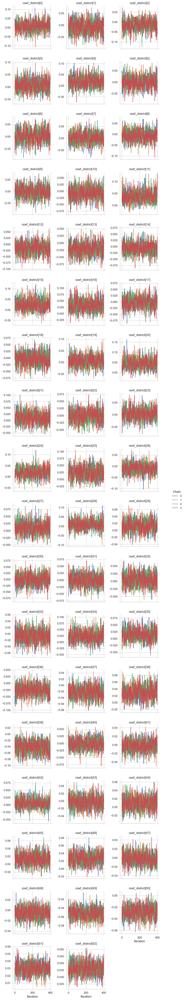

In [114]:
gs.plot_trace(results2, "coef_district")

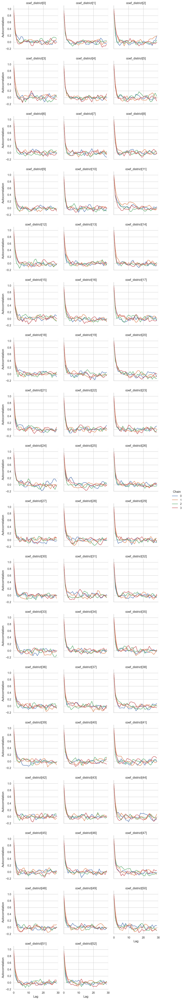

In [115]:
gs.plot_cor(results2, "coef_district")

In [116]:
# select samples for unique districts
unique_districts = zambia.reset_index().drop_duplicates(subset="district_name")
districts = unique_districts["district_name"].values
i = unique_districts["index"].astype(int).values - 1

s_district_samples = np.asarray(samples2[s_district.name][..., i])

# compute posterior summaries
s_district_mean = np.mean(s_district_samples, axis=(0, 1))
s_district_lo = np.quantile(s_district_samples, 0.025, axis=(0, 1))
s_district_hi = np.quantile(s_district_samples, 0.975, axis=(0, 1))

# collect in data frame
districts = pd.DataFrame({
    "districts": districts,
    "s_district_mean": s_district_mean,
    "s_district_lo": s_district_lo,
    "s_district_hi": s_district_hi
})

# turn districts into categorical
districts["districts"] = pd.Categorical(districts["districts"], categories=districts["districts"].values)

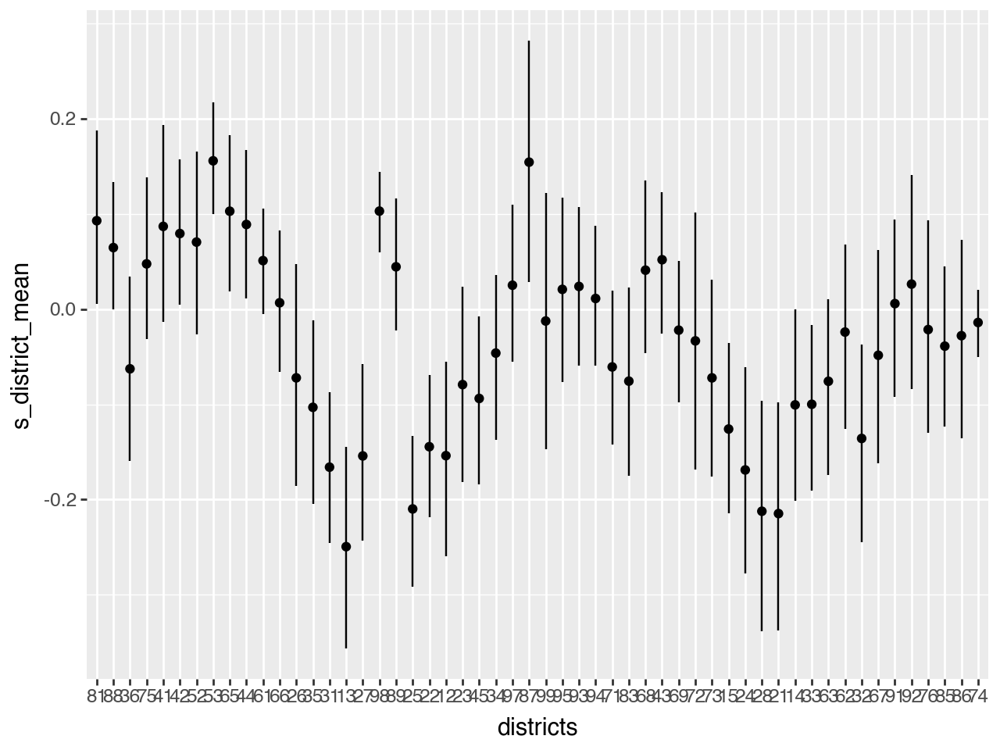

In [117]:
(
    p9.ggplot(districts)
    + p9.geom_linerange(p9.aes(x="districts", ymin="s_district_lo", ymax="s_district_hi"))
    + p9.geom_point(p9.aes(x="districts", y="s_district_mean"))
)

# Model 3

In [118]:
_ = model2.pop_nodes_and_vars() # free variables from previous model

## Model Setup

### Spatial effect as random effect

In [119]:
%%R -o basis_age_r,pen_age_r
# set up basis matrix and penalty matrix in magcv

s_district <- mgcv::smoothCon(
    s(district, bs="re"),
    data = zambia,
    knots = NULL,
    absorb.cons = TRUE
)

# basis_age_r <- s_age[[1]]$X
# pen_age_r <- s_age[[1]]$S[[1]]

# optional diagonalization of the penalty matrix
s_district <- s_district[[1]] |> mgcv::smooth2random(vnames = "", type = 2)

basis_district_r <- cbind(s_district$rand$Xr, s_district$Xf)
pen_district_r <- diag(s_district$pen.ind)

In [120]:
# get R objects into python
basis_district_r = robjects.globalenv['basis_district_r']
pen_district_r = robjects.globalenv['pen_district_r']

In [121]:
# set up structured additive term in liesel
basis_district = lsl.Var.new_obs(basis_district_r, name="basis_district")

mvnd = MVND.from_penalty(loc=0.0, var=1.0, pen=pen_district_r)

# set up tau2 prior and variable
# tau2_district_prior = lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01)
# tau2_district = lsl.Var.new_param(10.0, tau2_district_prior, name="tau2_district")
# var_param_district = tau2_district

# A diffuse prior with nonzero density at zero
# The scale can be set according to the principles of a scale-dependent prior
# See Klein & Kneib (2016) for details
tau_district_prior = lsl.Dist(tfd.Weibull, concentration=0.5, scale=20.0)
tau_district = lsl.Var.new_param(10.0, tau_district_prior, name="tau_district")
tau2_district = lsl.Var.new_calc(jnp.square, tau_district, name="tau2_district")
var_param_district = tau_district


# set up coefficient prior
coef_district_prior = lsl.Dist(
    MVND.from_penalty,
    loc=0.0,
    var=tau2_district,
    pen=pen_district_r,
    rank=mvnd.rank,
    log_pdet=mvnd.log_pdet
)

# set up coefficient variable
coef_district = lsl.Var.new_param(
    value=jnp.zeros(basis_district_r.shape[1]),
    distribution=coef_district_prior,
    name="coef_district"
)

# set up effect variable
s_district = lsl.Var.new_calc(jnp.dot, basis_district, coef_district, name="s_district")

In [122]:
loc = lsl.Var.new_calc(
    lambda *args: sum(args), 
    intercept, s_age, s_bmi, s_district,
    name="loc"
)

z_dist = lsl.Dist(tfd.Normal, loc=loc, scale=scale)
z = lsl.Var.new_obs(zambia["z"].values, distribution=z_dist, name="z")

In [123]:
model3 = lsl.Model([z])
interface = gs.LieselInterface(model3)

liesel.model.model - INFO - Converted dtype of Value(name="z_value").value
liesel.model.model - INFO - Converted dtype of Value(name="").value
liesel.model.model - INFO - Converted dtype of Value(name="basis_district_value").value


## Parameter estimation

### Pre-optimize for starting values

In [124]:
# crude, but robust optimization
preopt = gs.optim_flat(
    model_train=model3,
    params=[intercept.name, coef_age.name, coef_bmi.name, coef_district.name, variance.name],
    stopper=gs.Stopper(max_iter=10_000, patience=10, atol=1e-3),
    optimizer=optax.adam(learning_rate=0.01)
)

Training loss: 19139.555, Validation loss: 19139.559:   8%|▊         | 763/10000 [00:07<01:26, 106.75it/s]

### MCMC Sampling

In [125]:
eb = gs.EngineBuilder(seed=42, num_chains=4)

eb.set_model(interface)
eb.set_initial_values(preopt.model_state)

eb.add_kernel(gs.NUTSKernel([intercept.name]))

eb.add_kernel(gs.IWLSKernel([coef_age.name]))
eb.add_kernel(gs.IWLSKernel([coef_bmi.name]))
eb.add_kernel(gs.IWLSKernel([coef_district.name]))

eb.add_kernel(gs.NUTSKernel([var_param_age.name]))
eb.add_kernel(gs.NUTSKernel([var_param_bmi.name]))
eb.add_kernel(gs.NUTSKernel([var_param_district.name]))

eb.add_kernel(gs.NUTSKernel([variance.name]))

eb.positions_included = [s_age.name, s_bmi.name, s_district.name]

eb.set_duration(warmup_duration=2000, posterior_duration=4000, thinning_posterior=10)

In [126]:
engine = eb.build()

liesel.goose.builder - WARNING - No jitter functions provided. The initial values won't be jittered
liesel.goose.engine - INFO - Initializing kernels...
liesel.goose.engine - INFO - Done


In [127]:
engine.sample_all_epochs()

liesel.goose.engine - INFO - Starting epoch: FAST_ADAPTATION, 75 transitions, 25 jitted together
100%|██████████████████████████████████████████| 3/3 [00:13<00:00,  4.48s/chunk] [00:22<01:26, 106.75it/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 0, 0, 0, 2 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_04: 13, 11, 11, 10 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_05: 13, 8, 13, 8 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_06: 13, 10, 7, 8 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_07: 0, 1, 0, 1 / 75 transitions
liesel.goose.engine - INFO - Finished epoch
liesel.goose.engine - INFO - Starting epoch: SLOW_ADAPTATION, 25 transitions, 25 jitted together
100%|█████████████████████████████████████████| 1/1 [00:00<00:00, 473.93chunk/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 1, 1, 1, 1 / 25 transitions
liesel.goose.e

In [128]:
results3 = engine.get_results()
samples3 = results3.get_posterior_samples()
summary3 = gs.Summary(results3, deselected=eb.positions_included)

### MCMC Diagnostics

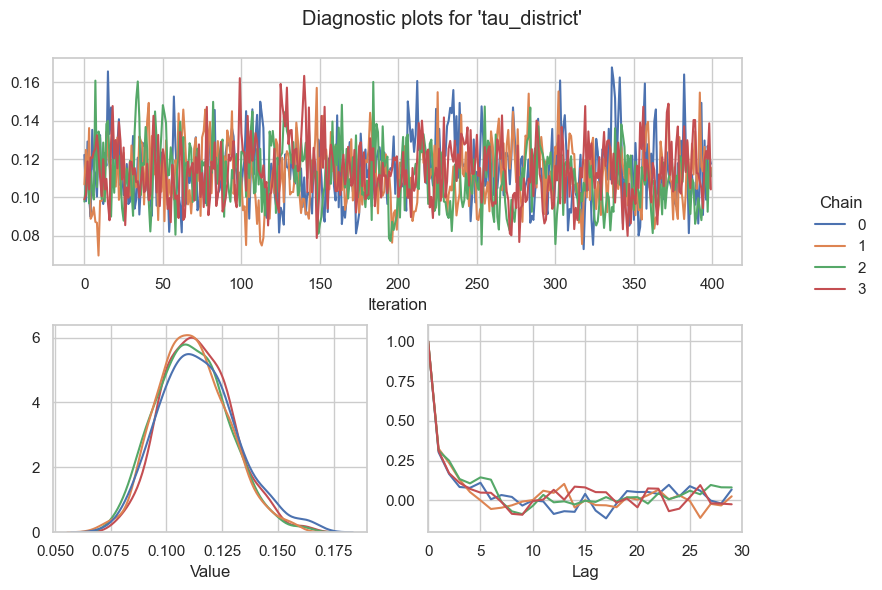

In [129]:
try:
    gs.plot_param(results3, "tau2_district")
except KeyError:
    gs.plot_param(results3, "tau_district")

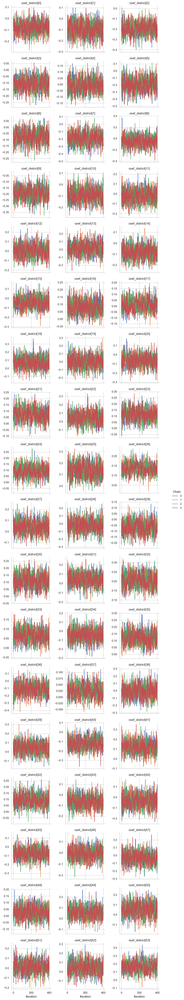

In [130]:
gs.plot_trace(results3, "coef_district")

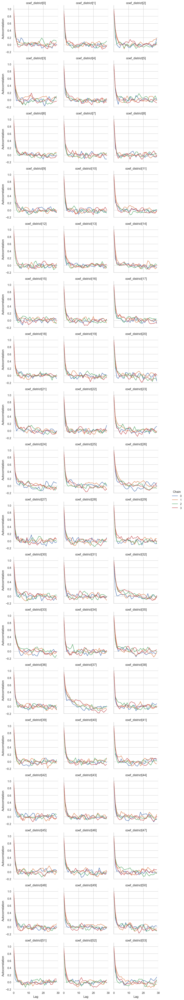

In [131]:
gs.plot_cor(results3, "coef_district")

## Results

In [132]:
# select samples for unique districts
s_district_samples = np.asarray(samples3[s_district.name][..., i])

# compute posterior summaries
s_district_mean = np.mean(s_district_samples, axis=(0, 1))
s_district_lo = np.quantile(s_district_samples, 0.025, axis=(0, 1))
s_district_hi = np.quantile(s_district_samples, 0.975, axis=(0, 1))

districts["s_district_mean_re"] = s_district_mean
districts["s_district_lo_re"] = s_district_lo
districts["s_district_hi_re"] = s_district_hi

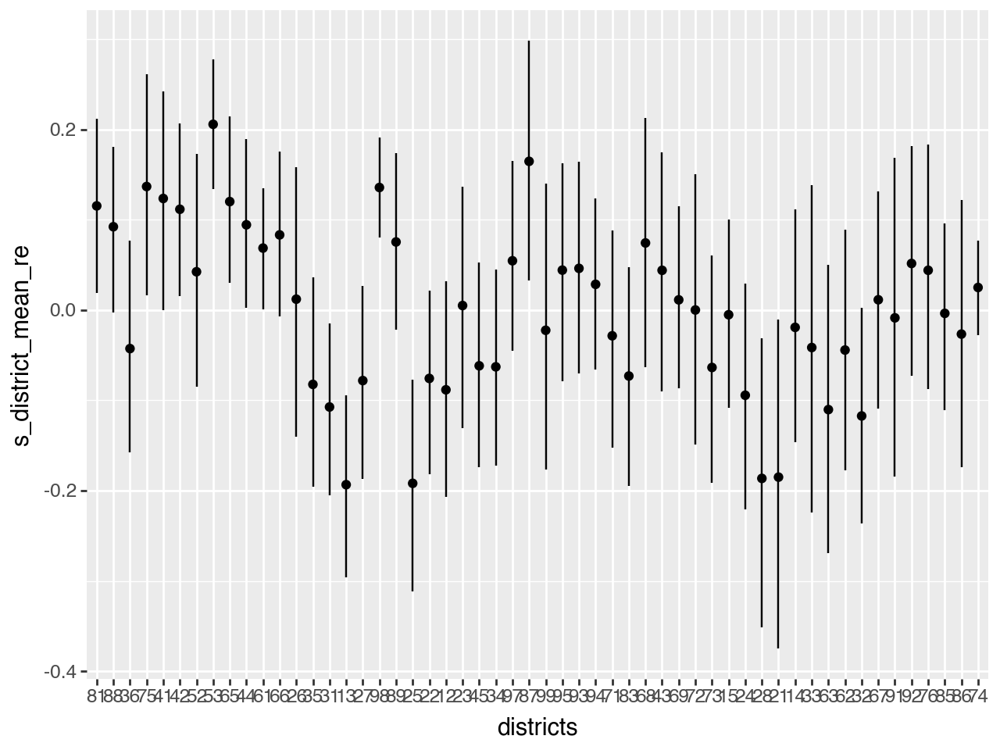

In [133]:
(
    p9.ggplot(districts)
    + p9.geom_linerange(p9.aes(x="districts", ymin="s_district_lo_re", ymax="s_district_hi_re"))
    + p9.geom_point(p9.aes(x="districts", y="s_district_mean_re"))
)

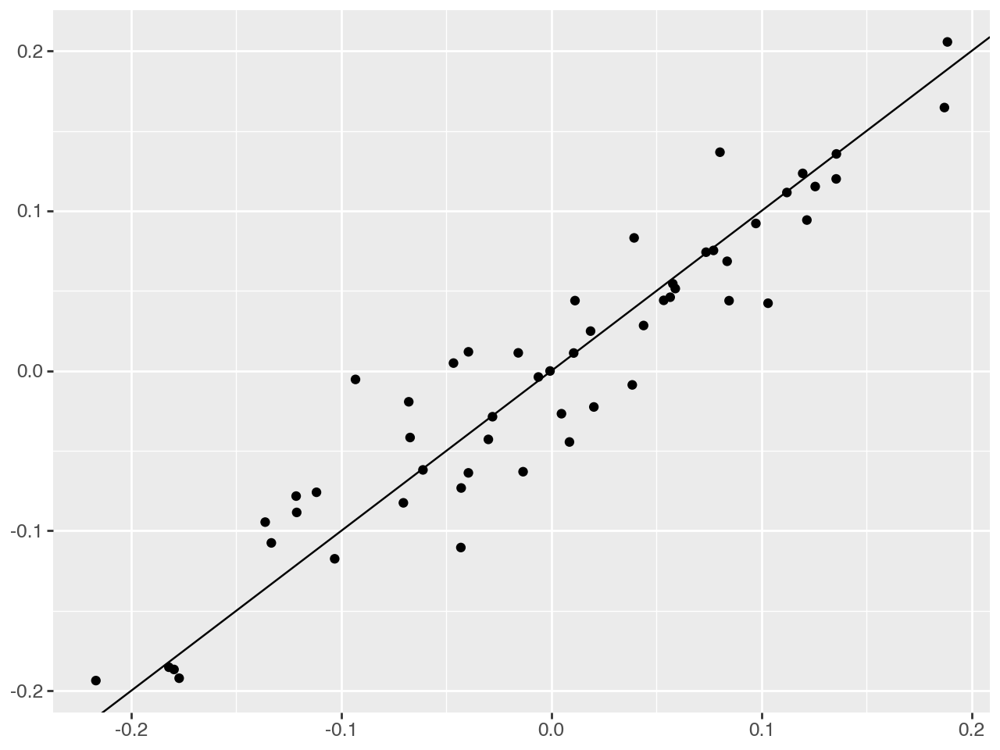

In [134]:
s_district_samples2 = np.asarray(samples2[s_district.name][..., i]).mean(axis=(0, 1))
s_district_samples3 = np.asarray(samples3[s_district.name][..., i]).mean(axis=(0, 1))

s_district_samples2 = s_district_samples2 - s_district_samples2.mean()
s_district_samples3 = s_district_samples3 - s_district_samples3.mean()

(
    p9.ggplot()
    + p9.aes(s_district_samples2, s_district_samples3)
    + p9.geom_point()
    + p9.geom_abline(intercept=0, slope=1)
)

# Model 4

In [135]:
_ = model3.pop_nodes_and_vars() # free variables from previous model

## Model setup

In [136]:
%%R -o basis_age_survey1996_r,pen_age_survey1996_r
zambia$survey1996 <- 1*(zambia$survey==1996)

# set up basis matrix and penalty matrix in magcv
s_age_survey1996 <- mgcv::smoothCon(
    s(age, bs="ps", m=c(3,2), k=20, by=survey1996),
    data = zambia,
    knots = NULL,
    absorb.cons = TRUE
)


# optional diagonalization of the penalty matrix
s_age_survey1996 <- s_age_survey1996[[1]] |> mgcv::smooth2random(vnames = "", type = 2)

basis_age_survey1996_r <- cbind(s_age_survey1996$rand$Xr, s_age_survey1996$Xf)
pen_age_survey1996_r <- diag(s_age_survey1996$pen.ind)

In [137]:
# get R objects into python
basis_age_survey1996_r = robjects.globalenv['basis_age_survey1996_r']
pen_age_survey1996_r = robjects.globalenv['pen_age_survey1996_r']

In [138]:
# set up structured additive term in liesel
basis_age_survey1996 = lsl.Var.new_obs(basis_age_survey1996_r, name="basis_age_survey1996")

mvnd = MVND.from_penalty(loc=0.0, var=1.0, pen=pen_age_survey1996_r)

# set up tau2 prior and variable
# tau2_age_survey1996_prior = lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01)
# tau2_age_survey1996 = lsl.Var.new_param(10.0, tau2_age_survey1996_prior, name="tau2_age_survey1996")
# var_param_age_survey1996 = tau2_age_survey1996

# A diffuse prior with nonzero density at zero
# The scale can be set according to the principles of a scale-dependent prior
# See Klein & Kneib (2016) for details
tau_age_survey1996_prior = lsl.Dist(tfd.Weibull, concentration=0.5, scale=20.0)
tau_age_survey1996 = lsl.Var.new_param(10.0, tau_age_survey1996_prior, name="tau_age_survey1996")
tau2_age_survey1996 = lsl.Var.new_calc(jnp.square, tau_age_survey1996, name="tau2_age_survey1996")
var_param_age_survey1996 = tau_age_survey1996


# set up coefficient prior
coef_age_survey1996_prior = lsl.Dist(
    MVND.from_penalty,
    loc=0.0,
    var=tau2_age_survey1996,
    pen=pen_age_survey1996_r,
    rank=mvnd.rank,
    log_pdet=mvnd.log_pdet
)

# set up coefficient variable
coef_age_survey1996 = lsl.Var.new_param(
    value=jnp.zeros(basis_age_survey1996_r.shape[1]),
    distribution=coef_age_survey1996_prior,
    name="coef_age_survey1996"
)

# set up effect variable
s_age_survey1996 = lsl.Var.new_calc(jnp.dot, basis_age_survey1996, coef_age_survey1996, name="s_age_survey1996")

In [139]:
%%R -o basis_age_survey2001_r,pen_age_survey2001_r
zambia$survey2001 <- 1*(zambia$survey==2001)

# set up basis matrix and penalty matrix in magcv
s_age_survey2001 <- mgcv::smoothCon(
    s(age, bs="ps", m=c(3,2), k=20, by=survey2001),
    data = zambia,
    knots = NULL,
    absorb.cons = TRUE
)


# optional diagonalization of the penalty matrix
s_age_survey2001 <- s_age_survey2001[[1]] |> mgcv::smooth2random(vnames = "", type = 2)

basis_age_survey2001_r <- cbind(s_age_survey2001$rand$Xr, s_age_survey2001$Xf)
pen_age_survey2001_r <- diag(s_age_survey2001$pen.ind)

In [140]:
# get R objects into python
basis_age_survey2001_r = robjects.globalenv['basis_age_survey2001_r']
pen_age_survey2001_r = robjects.globalenv['pen_age_survey2001_r']

In [141]:
# set up structured additive term in liesel
basis_age_survey2001 = lsl.Var.new_obs(basis_age_survey2001_r, name="basis_age_survey2001")

mvnd = MVND.from_penalty(loc=0.0, var=1.0, pen=pen_age_survey2001_r)


# set up tau2 prior and variable
# tau2_age_survey2001_prior = lsl.Dist(tfd.InverseGamma, concentration=0.01, scale=0.01)
# tau2_age_survey2001 = lsl.Var.new_param(10.0, tau2_age_survey2001_prior, name="tau2_age_survey2001")
# var_param_age_survey2001 = tau2_age_survey2001

# A diffuse prior with nonzero density at zero
# The scale can be set according to the principles of a scale-dependent prior
# See Klein & Kneib (2016) for details
tau_age_survey2001_prior = lsl.Dist(tfd.Weibull, concentration=0.5, scale=20.0)
tau_age_survey2001 = lsl.Var.new_param(10.0, tau_age_survey2001_prior, name="tau_age_survey2001")
tau2_age_survey2001 = lsl.Var.new_calc(jnp.square, tau_age_survey2001, name="tau2_age_survey2001")
var_param_age_survey2001 = tau_age_survey2001


# set up coefficient prior
coef_age_survey2001_prior = lsl.Dist(
    MVND.from_penalty,
    loc=0.0,
    var=tau2_age_survey2001,
    pen=pen_age_survey2001_r,
    rank=mvnd.rank,
    log_pdet=mvnd.log_pdet
)

# set up coefficient variable
coef_age_survey2001 = lsl.Var.new_param(
    value=jnp.zeros(basis_age_survey2001_r.shape[1]),
    distribution=coef_age_survey2001_prior,
    name="coef_age_survey2001"
)

# set up effect variable
s_age_survey2001 = lsl.Var.new_calc(jnp.dot, basis_age_survey2001, coef_age_survey2001, name="s_age_survey2001")

In [142]:
loc = lsl.Var.new_calc(
    lambda *args: sum(args), 
    intercept, s_age, s_bmi, s_age_survey1996, s_age_survey2001,
    name="loc")

z_dist = lsl.Dist(tfd.Normal, loc=loc, scale=scale)
z = lsl.Var.new_obs(zambia["z"].values, distribution=z_dist, name="z")

liesel.model.model - INFO - Converted dtype of Value(name="z_value").value
liesel.model.model - INFO - Converted dtype of Value(name="").value
liesel.model.model - INFO - Converted dtype of Value(name="basis_age_survey2001_value").value
liesel.model.model - INFO - Converted dtype of Value(name="").value
liesel.model.model - INFO - Converted dtype of Value(name="basis_age_survey1996_value").value
liesel.model.nodes - INFO - Unnamed nodes were temporarily named for plottingThe automatically assigned names are: ['n14', 'n15', 'n16', 'n17', 'n18', 'n19', 'n20', 'n21', 'n22', 'n23', 'n24', 'n25']. The names are reset after plotting.


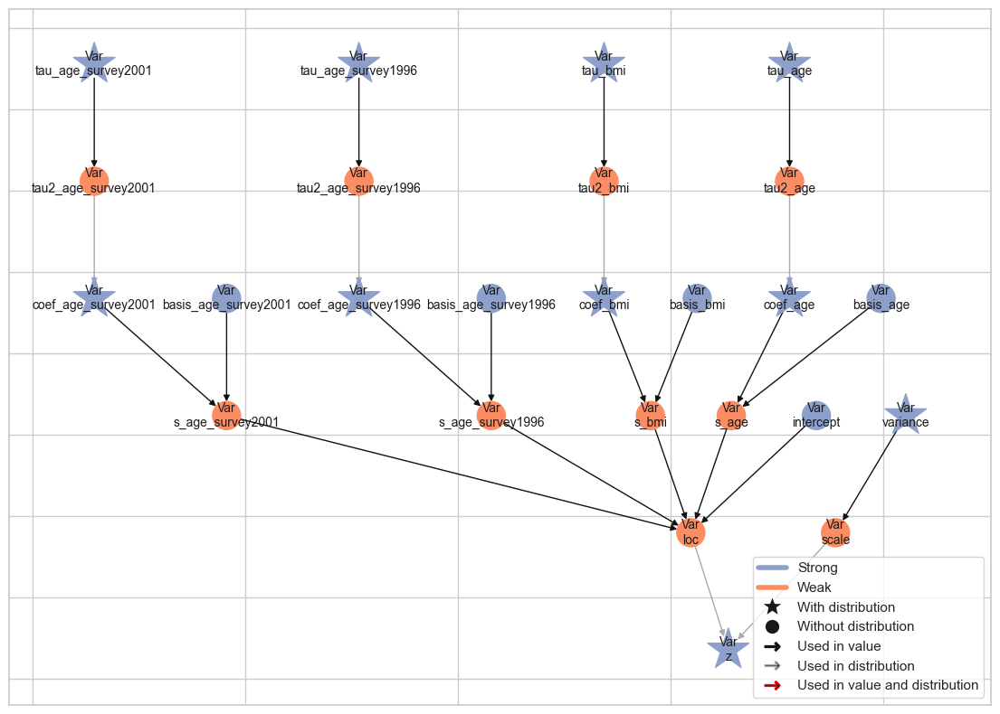

In [143]:
z.plot_vars()

In [144]:
model4 = lsl.Model([z])
interface = gs.LieselInterface(model4)

## Parameter Estimation

### Pre-optimize for starting values

In [145]:
# crude, but robust optimization
preopt = gs.optim_flat(
    model_train=model4,
    params=[intercept.name, coef_age.name, coef_bmi.name, coef_age_survey1996.name, coef_age_survey2001.name, variance.name],
    stopper=gs.Stopper(max_iter=10_000, patience=10, atol=1e-3),
    optimizer=optax.adam(learning_rate=0.01)
)

Training loss: 19159.895, Validation loss: 19159.896:   8%|▊         | 848/10000 [00:09<01:31, 100.23it/s]

### MCMC Sampling

In [146]:
eb = gs.EngineBuilder(seed=42, num_chains=4)

eb.set_model(interface)
eb.set_initial_values(preopt.model_state)

eb.add_kernel(gs.NUTSKernel([intercept.name]))

eb.add_kernel(gs.IWLSKernel([coef_age.name]))
eb.add_kernel(gs.IWLSKernel([coef_bmi.name]))
eb.add_kernel(gs.IWLSKernel([coef_age_survey1996.name]))
eb.add_kernel(gs.IWLSKernel([coef_age_survey2001.name]))

eb.add_kernel(gs.NUTSKernel([var_param_age.name]))
eb.add_kernel(gs.NUTSKernel([var_param_bmi.name]))
eb.add_kernel(gs.NUTSKernel([var_param_age_survey1996.name]))
eb.add_kernel(gs.NUTSKernel([var_param_age_survey2001.name]))

eb.add_kernel(gs.NUTSKernel([variance.name]))

eb.positions_included = [s_age.name, s_age_survey1996.name, s_age_survey2001.name]

eb.set_duration(warmup_duration=2000, posterior_duration=4000, thinning_posterior=10)

In [147]:
engine = eb.build()

liesel.goose.builder - WARNING - No jitter functions provided. The initial values won't be jittered
liesel.goose.engine - INFO - Initializing kernels...
liesel.goose.engine - INFO - Done


In [148]:
engine.sample_all_epochs()

liesel.goose.engine - INFO - Starting epoch: FAST_ADAPTATION, 75 transitions, 25 jitted together


100%|██████████████████████████████████████████| 3/3 [00:17<00:00,  5.94s/chunk] [00:27<01:31, 100.23it/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 1, 1, 0, 0 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_05: 10, 12, 9, 11 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_06: 10, 12, 8, 15 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_07: 9, 10, 11, 6 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_08: 15, 11, 16, 7 / 75 transitions
liesel.goose.engine - WARNING - Errors per chain for kernel_09: 1, 1, 1, 0 / 75 transitions
liesel.goose.engine - INFO - Finished epoch
liesel.goose.engine - INFO - Starting epoch: SLOW_ADAPTATION, 25 transitions, 25 jitted together
100%|█████████████████████████████████████████| 1/1 [00:00<00:00, 409.80chunk/s]
liesel.goose.engine - WARNING - Errors per chain for kernel_00: 1, 1, 2, 1 / 25 transitions
liesel.goose.eng

In [149]:
results4 = engine.get_results()
samples4 = results4.get_posterior_samples()
summary4 = gs.Summary(results4, deselected=eb.positions_included)

### MCMC Diagnostics

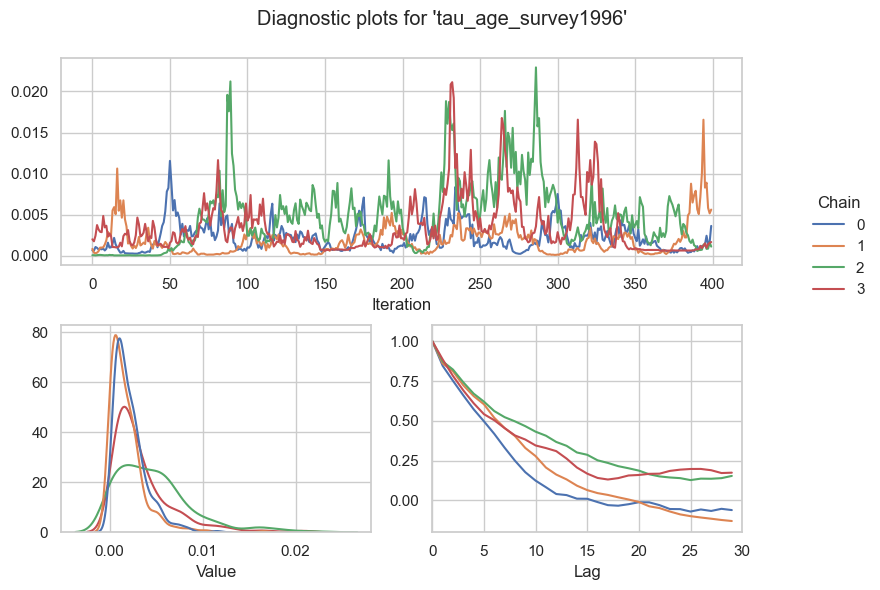

In [150]:
try:
    gs.plot_param(results4, "tau2_age_survey1996")
except KeyError:
    gs.plot_param(results4, "tau_age_survey1996")

In [151]:
try:
    gs.plot_param(results1, "tau2_age_survey2001")
except KeyError:
    gs.plot_param(results1, "tau_age_survey2001")

KeyError: "All params must be in ['coef_age', 'coef_bmi', 'intercept', 's_age', 's_bmi', 'tau_age', 'tau_bmi', 'variance']."

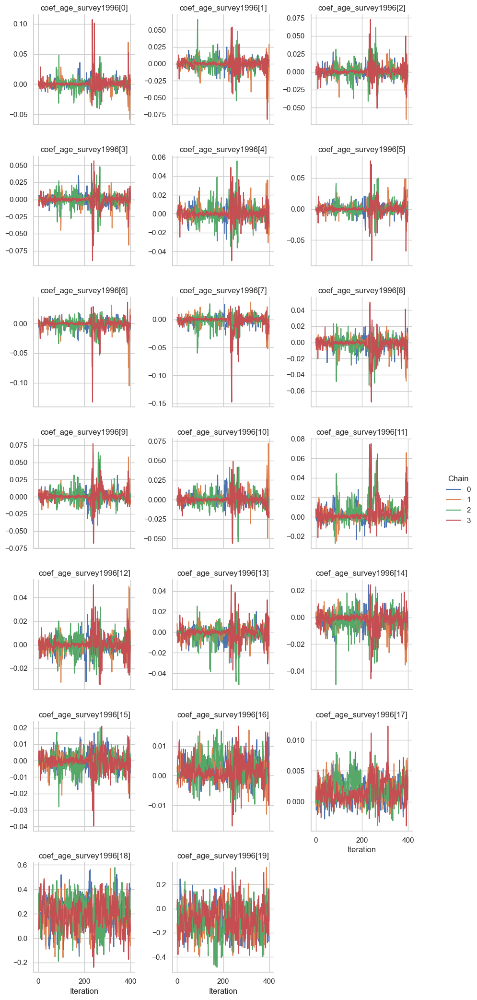

In [ ]:
gs.plot_trace(results4, "coef_age_survey1996")

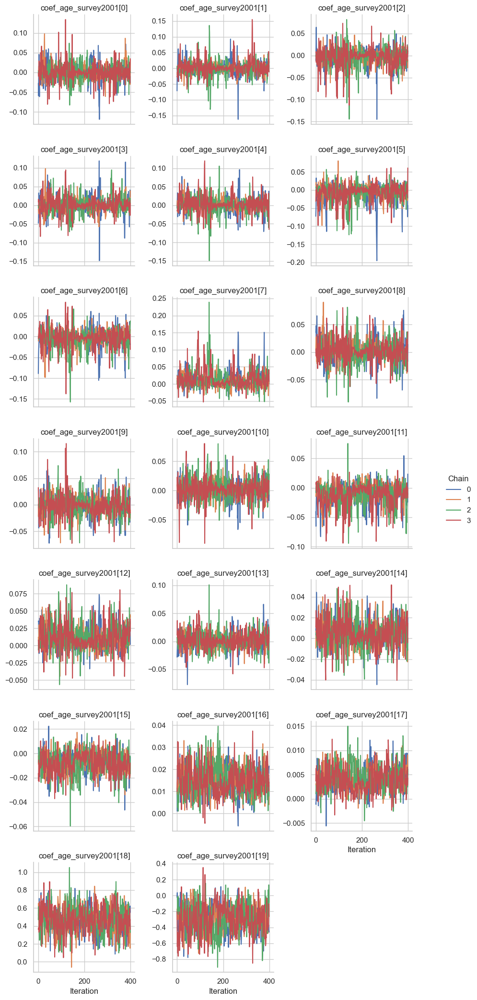

In [ ]:
gs.plot_trace(results4, "coef_age_survey2001")

## Results

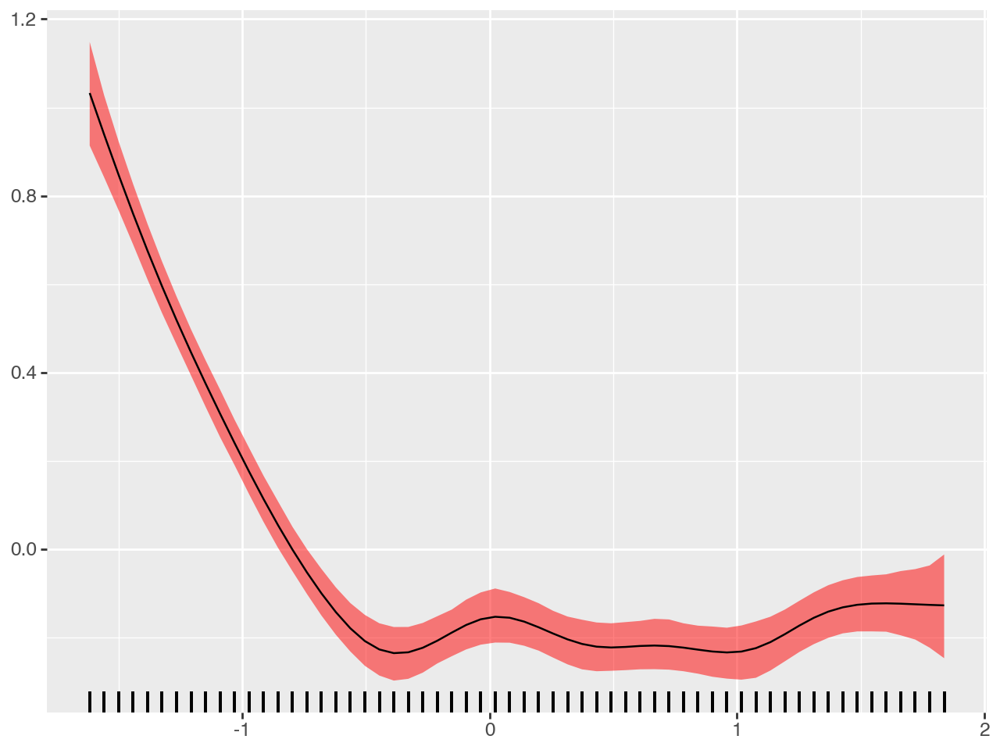

In [ ]:
age = zambia["age"].values
age_samples = np.asarray(samples4[s_age.name]) # convert to numpy array for plotting

s_age_mean = np.mean(age_samples, axis=(0, 1))
s_age_lo = np.quantile(age_samples, 0.025, axis=(0, 1))
s_age_hi = np.quantile(age_samples, 0.975, axis=(0, 1))

(
    p9.ggplot()
    + p9.geom_ribbon(p9.aes(x=age, ymin=s_age_lo, ymax=s_age_hi), alpha=0.5, fill = "red")
    + p9.geom_line(p9.aes(x=age, y=s_age_mean))
    + p9.geom_rug(p9.aes(x=age), alpha = 0.1)
)

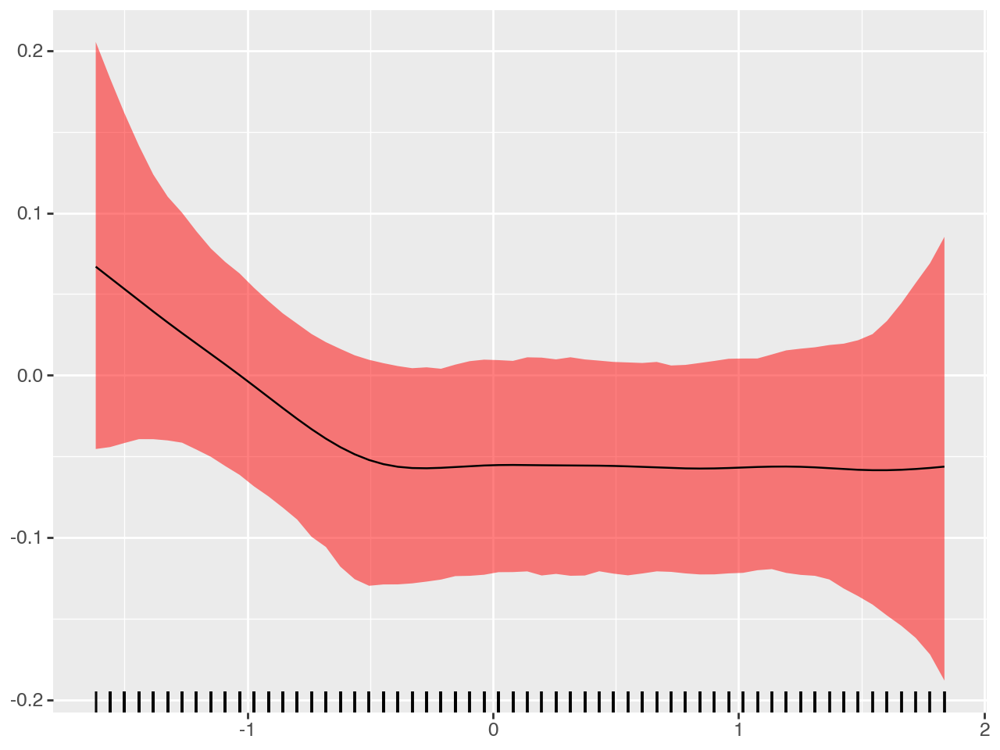

In [ ]:
i_1996 = zambia.reset_index().query("survey == 1996")["index"].astype(int).values - 1
age_1996 = zambia.reset_index().query("survey == 1996")["age"].values

age_survey1996_samples = np.asarray(samples4[s_age_survey1996.name][..., i_1996]) # convert to numpy array for plotting

s_age_survey1996_mean = np.mean(age_survey1996_samples, axis=(0, 1))
s_age_survey1996_lo = np.quantile(age_survey1996_samples, 0.025, axis=(0, 1))
s_age_survey1996_hi = np.quantile(age_survey1996_samples, 0.975, axis=(0, 1))

(
    p9.ggplot()
    + p9.geom_ribbon(p9.aes(x=age_1996, ymin=s_age_survey1996_lo, ymax=s_age_survey1996_hi), alpha=0.5, fill = "red")
    + p9.geom_line(p9.aes(x=age_1996, y=s_age_survey1996_mean))
    + p9.geom_rug(p9.aes(x=age_1996), alpha = 0.1)
)

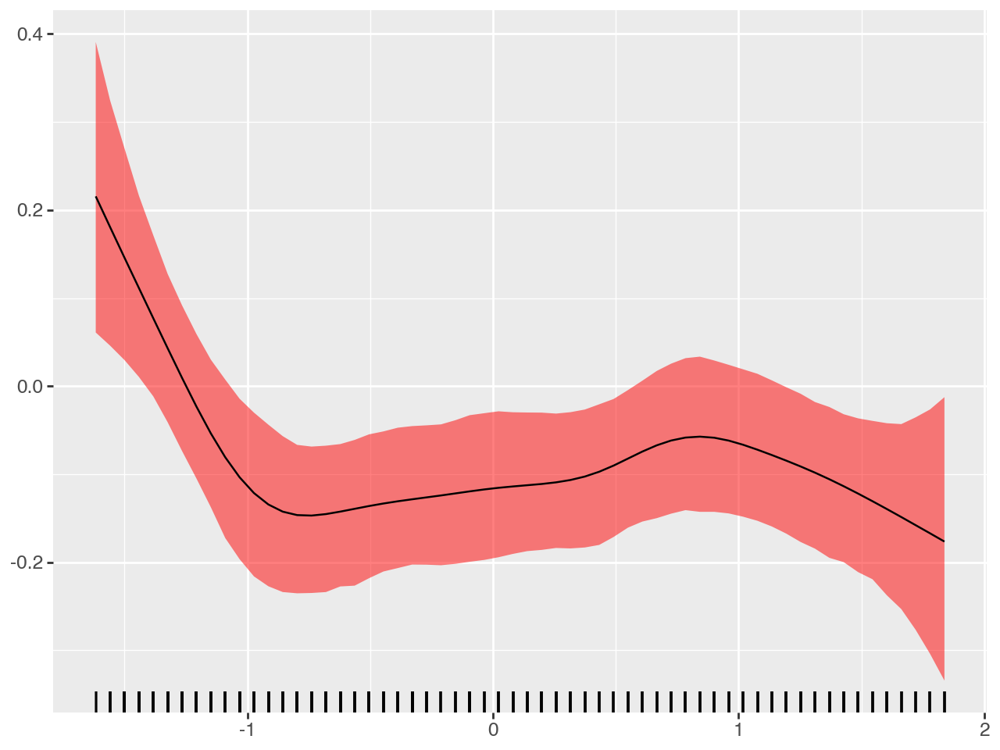

In [ ]:
i_2001 = zambia.reset_index().query("survey == 2001")["index"].astype(int).values - 1
age_2001 = zambia.reset_index().query("survey == 2001")["age"].values

age_survey2001_samples = np.asarray(samples4[s_age_survey2001.name][..., i_2001]) # convert to numpy array for plotting

s_age_survey2001_mean = np.mean(age_survey2001_samples, axis=(0, 1))
s_age_survey2001_lo = np.quantile(age_survey2001_samples, 0.025, axis=(0, 1))
s_age_survey2001_hi = np.quantile(age_survey2001_samples, 0.975, axis=(0, 1))

(
    p9.ggplot()
    + p9.geom_ribbon(p9.aes(x=age_2001, ymin=s_age_survey2001_lo, ymax=s_age_survey2001_hi), alpha=0.5, fill = "red")
    + p9.geom_line(p9.aes(x=age_2001, y=s_age_survey2001_mean))
    + p9.geom_rug(p9.aes(x=age_2001), alpha = 0.1)
)